In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statistics as st
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier, plot_importance
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split

In [2]:
df=pd.read_excel('Churn.xlsx')

In [3]:
df

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,HI,area_code_408,50,yes,40,no,9.9,5,2.67,...,127,40.07,223,126,18.96,297.5,116,13.39,2,no
4996,4997,WV,area_code_415,152,no,0,no,14.7,2,3.97,...,90,31.31,256.8,73,21.83,213.6,113,9.61,3,yes
4997,4998,DC,area_code_415,61,no,0,no,13.6,4,3.67,...,89,23.9,172.8,128,14.69,212.4,97,9.56,1,no
4998,4999,DC,area_code_510,109,no,0,no,8.5,6,2.30,...,67,32.1,171.7,92,14.59,224.4,89,10.10,0,no


In [4]:
df.shape

(5000, 21)

In [5]:
df.isnull().sum()

Unnamed: 0        0
state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      5000 non-null   int64  
 1   state           5000 non-null   object 
 2   area.code       5000 non-null   object 
 3   account.length  5000 non-null   int64  
 4   voice.plan      5000 non-null   object 
 5   voice.messages  5000 non-null   int64  
 6   intl.plan       5000 non-null   object 
 7   intl.mins       5000 non-null   float64
 8   intl.calls      5000 non-null   int64  
 9   intl.charge     5000 non-null   float64
 10  day.mins        5000 non-null   float64
 11  day.calls       5000 non-null   int64  
 12  day.charge      5000 non-null   object 
 13  eve.mins        5000 non-null   object 
 14  eve.calls       5000 non-null   int64  
 15  eve.charge      5000 non-null   float64
 16  night.mins      5000 non-null   float64
 17  night.calls     5000 non-null   i

Columns like day.charge and eve.mins are object but should likely be numeric.

Unnamed: 0 is likely redundant and can be dropped.

In [8]:
# Drop redundant column
df.drop(columns=["Unnamed: 0"], inplace=True)


In [9]:
# Convert relevant object columns to numeric
df["day.charge"] = pd.to_numeric(df["day.charge"], errors="coerce")
df["eve.mins"] = pd.to_numeric(df["eve.mins"], errors="coerce")

# Drop rows with conversion errors
df.dropna(inplace=True)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4969 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           4969 non-null   object 
 1   area.code       4969 non-null   object 
 2   account.length  4969 non-null   int64  
 3   voice.plan      4969 non-null   object 
 4   voice.messages  4969 non-null   int64  
 5   intl.plan       4969 non-null   object 
 6   intl.mins       4969 non-null   float64
 7   intl.calls      4969 non-null   int64  
 8   intl.charge     4969 non-null   float64
 9   day.mins        4969 non-null   float64
 10  day.calls       4969 non-null   int64  
 11  day.charge      4969 non-null   float64
 12  eve.mins        4969 non-null   float64
 13  eve.calls       4969 non-null   int64  
 14  eve.charge      4969 non-null   float64
 15  night.mins      4969 non-null   float64
 16  night.calls     4969 non-null   int64  
 17  night.charge    4969 non-null   float6

In [11]:
df.shape

(4969, 20)

In [12]:
# Encode categorical columns
df["intl.plan"] = df["intl.plan"].map({"yes": 1, "no": 0})
df["voice.plan"] = df["voice.plan"].map({"yes": 1, "no": 0})
df["churn"] = df["churn"].map({"yes": 1, "no": 0})
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,1,25,0,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,0
1,OH,area_code_415,107,1,26,0,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,0
2,NJ,area_code_415,137,0,0,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,0
3,OH,area_code_408,84,0,0,1,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2,0
4,OK,area_code_415,75,0,0,1,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,1,40,0,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2,0
4996,WV,area_code_415,152,0,0,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3,1
4997,DC,area_code_415,61,0,0,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1,0
4998,DC,area_code_510,109,0,0,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0,0


In [13]:
# Summary statistics
df.describe(include='all')

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
count,4969,4969,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000,4969.000000
unique,51,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,WV,area_code_415,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,158,2479,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,100.206681,0.264641,7.754880,0.094586,10.264198,4.433085,2.771851,180.306178,100.021936,30.652604,200.617368,100.174884,17.052695,200.434675,99.954518,9.019670,1.571946,0.141880
std,NaN,NaN,39.695476,0.441186,13.545738,0.292672,2.761996,2.459495,0.745672,53.931206,19.835965,9.168275,50.550590,19.833572,4.296784,50.528158,19.959015,2.273776,1.307458,0.348962
min,NaN,NaN,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,73.000000,0.000000,0.000000,0.000000,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.400000,87.000000,14.140000,167.100000,87.000000,7.520000,1.000000,0.000000
50%,NaN,NaN,100.000000,0.000000,0.000000,0.000000,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000,0.000000
75%,NaN,NaN,127.000000,1.000000,17.000000,0.000000,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,113.000000,19.900000,234.700000,113.000000,10.560000,2.000000,0.000000


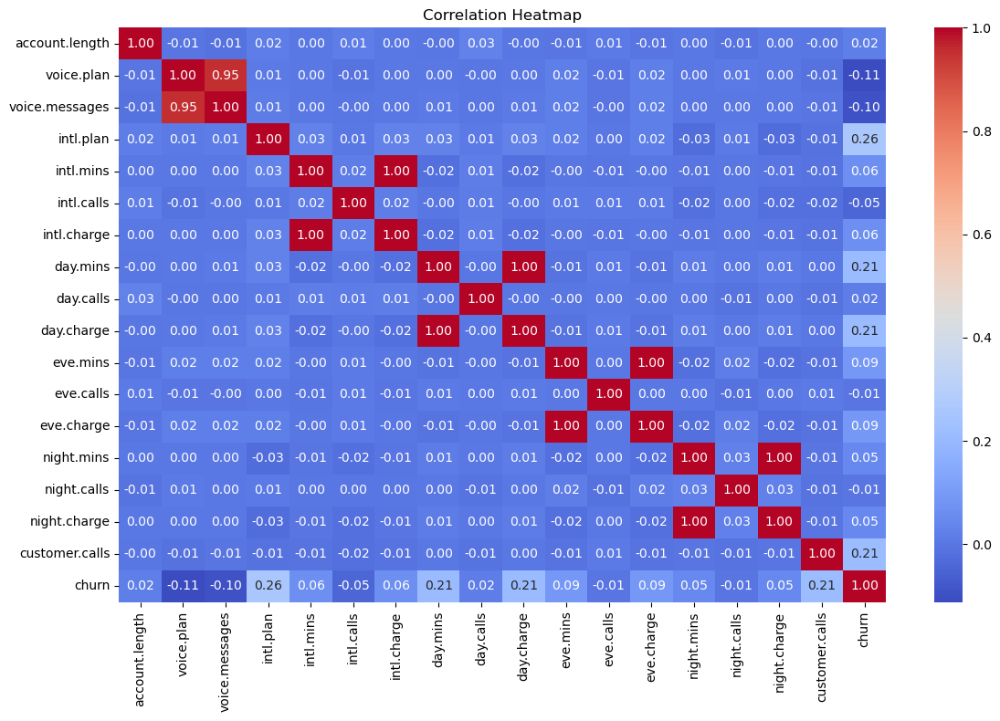

In [14]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, fmt=".2f", cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()


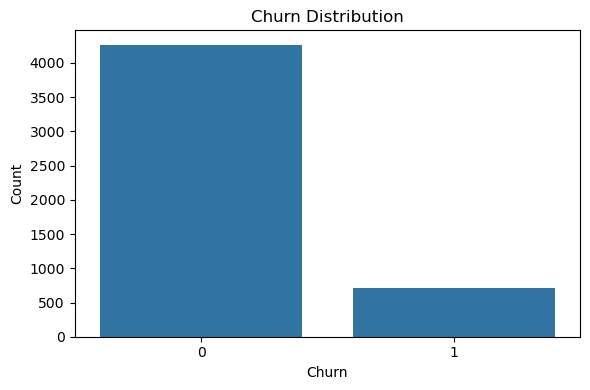

In [15]:
# Churn distribution
plt.figure(figsize=(6, 4))
sns.countplot(x='churn', data=df)
plt.title("Churn Distribution")
plt.xlabel("Churn")
plt.ylabel("Count")
plt.tight_layout()
plt.show()



Text(0.5, 1.0, 'Churn Rate by International Plan')

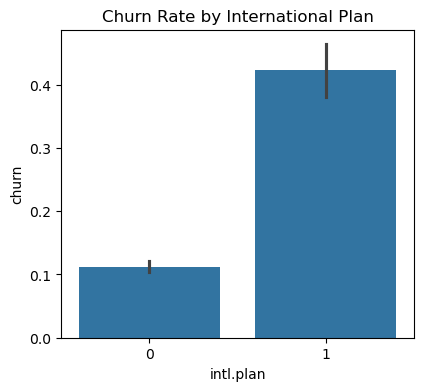

In [16]:
# Bar plots for plan-wise churn
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.barplot(x="intl.plan", y="churn", data=df)
plt.title("Churn Rate by International Plan")



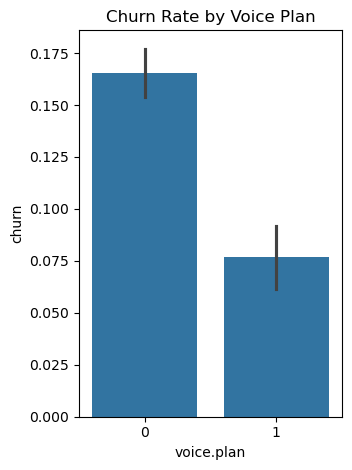

In [17]:
plt.subplot(1, 2, 2)
sns.barplot(x="voice.plan", y="churn", data=df)
plt.title("Churn Rate by Voice Plan")
plt.tight_layout()
plt.show()



customer calls>= 5 likely to churn & voice messages 0

day min > 250 likely to churn & voice messages 0


In [19]:
df['total_minutes'] = df['day.mins'] + df['eve.mins'] + df['night.mins'] + df['intl.mins']
df['total_calls'] = df['day.calls'] + df['eve.calls'] + df['night.calls'] + df['intl.calls']

In [20]:
df

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,...,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn,total_minutes,total_calls
0,KS,area_code_415,128,1,25,0,10.0,3,2.70,265.1,...,197.4,99,16.78,244.7,91,11.01,1,0,717.2,303
1,OH,area_code_415,107,1,26,0,13.7,3,3.70,161.6,...,195.5,103,16.62,254.4,103,11.45,1,0,625.2,332
2,NJ,area_code_415,137,0,0,0,12.2,5,3.29,243.4,...,121.2,110,10.30,162.6,104,7.32,0,0,539.4,333
3,OH,area_code_408,84,0,0,1,6.6,7,1.78,299.4,...,61.9,88,5.26,196.9,89,8.86,2,0,564.8,255
4,OK,area_code_415,75,0,0,1,10.1,3,2.73,166.7,...,148.3,122,12.61,186.9,121,8.41,3,0,512.0,359
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,HI,area_code_408,50,1,40,0,9.9,5,2.67,235.7,...,223.0,126,18.96,297.5,116,13.39,2,0,766.1,374
4996,WV,area_code_415,152,0,0,0,14.7,2,3.97,184.2,...,256.8,73,21.83,213.6,113,9.61,3,1,669.3,278
4997,DC,area_code_415,61,0,0,0,13.6,4,3.67,140.6,...,172.8,128,14.69,212.4,97,9.56,1,0,539.4,318
4998,DC,area_code_510,109,0,0,0,8.5,6,2.30,188.8,...,171.7,92,14.59,224.4,89,10.10,0,0,593.4,254


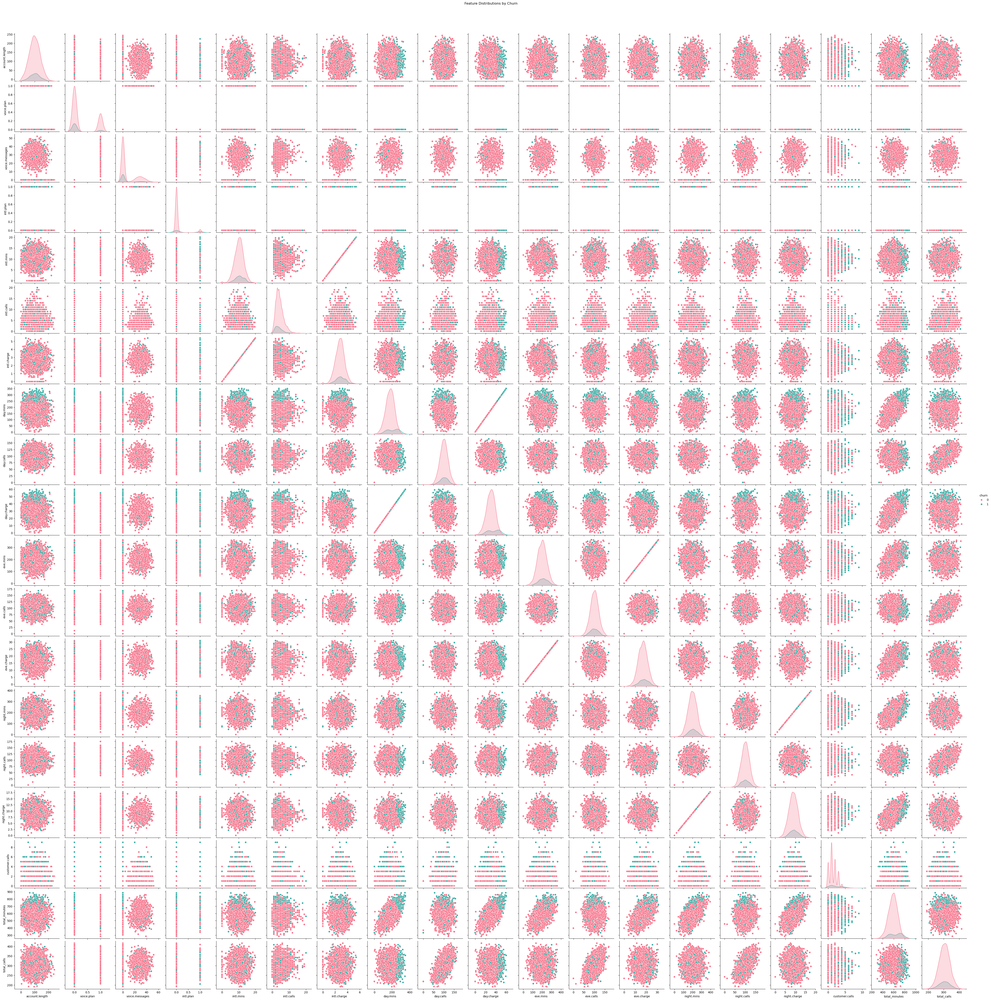

In [21]:
# Optional: If you want pairplot, ensure all selected columns are numeric
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
sns.pairplot(df[numeric_cols], hue='churn', diag_kind='kde', palette='husl')
plt.suptitle("Feature Distributions by Churn", y=1.02)
plt.show()

In [22]:


# Initialize the encoder
le_state = LabelEncoder()
le_area = LabelEncoder()

# Apply label encoding
df['state_encoded'] = le_state.fit_transform(df['state'])
df['area_code_encoded'] = le_area.fit_transform(df['area.code'])



In [23]:
# Drop the original columns (optional if not needed)
df.drop(columns=['state', 'area.code'], inplace=True)

In [24]:
df.columns

Index(['account.length', 'voice.plan', 'voice.messages', 'intl.plan',
       'intl.mins', 'intl.calls', 'intl.charge', 'day.mins', 'day.calls',
       'day.charge', 'eve.mins', 'eve.calls', 'eve.charge', 'night.mins',
       'night.calls', 'night.charge', 'customer.calls', 'churn',
       'total_minutes', 'total_calls', 'state_encoded', 'area_code_encoded'],
      dtype='object')

In [25]:
ds=df.copy()
ds

,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,...,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn,total_minutes,total_calls,state_encoded,area_code_encoded
0,128,1,25,0,10.0,3,2.70,265.1,110,45.07,...,16.78,244.7,91,11.01,1,0,717.2,303,16,1
1,107,1,26,0,13.7,3,3.70,161.6,123,27.47,...,16.62,254.4,103,11.45,1,0,625.2,332,35,1
2,137,0,0,0,12.2,5,3.29,243.4,114,41.38,...,10.30,162.6,104,7.32,0,0,539.4,333,31,1
3,84,0,0,1,6.6,7,1.78,299.4,71,50.90,...,5.26,196.9,89,8.86,2,0,564.8,255,35,0
4,75,0,0,1,10.1,3,2.73,166.7,113,28.34,...,12.61,186.9,121,8.41,3,0,512.0,359,36,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,50,1,40,0,9.9,5,2.67,235.7,127,40.07,...,18.96,297.5,116,13.39,2,0,766.1,374,11,0
4996,152,0,0,0,14.7,2,3.97,184.2,90,31.31,...,21.83,213.6,113,9.61,3,1,669.3,278,49,1
4997,61,0,0,0,13.6,4,3.67,140.6,89,23.90,...,14.69,212.4,97,9.56,1,0,539.4,318,7,1
4998,109,0,0,0,8.5,6,2.30,188.8,67,32.10,...,14.59,224.4,89,10.10,0,0,593.4,254,7,2


In [26]:

scaler = StandardScaler()
X_scaled = scaler.fit_transform(ds)


In [27]:

X1 = ds.loc[:,['account.length', 'voice.plan', 'voice.messages', 'intl.plan',
       'intl.mins', 'intl.calls', 'intl.charge', 'day.mins', 'day.calls',
       'day.charge', 'eve.mins', 'eve.calls', 'eve.charge', 'night.mins',
       'night.calls', 'night.charge', 'customer.calls',
       'total_minutes', 'total_calls', 'state_encoded', 'area_code_encoded']]
y1 = ds['churn']

In [28]:

# Split data
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42, stratify=y1)

# logestic reg

In [30]:
# Pipeline: StandardScaler + Logistic Regression
log_model = LogisticRegression(random_state=42)
# Train the model
log_model.fit(X_train, y_train)


C:\Users\lbt99\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(random_state=42)

📊 Classification Report:

              precision    recall  f1-score   support

    No Churn       0.86      0.99      0.92       853
       Churn       0.43      0.06      0.11       141

    accuracy                           0.86       994
   macro avg       0.65      0.52      0.52       994
weighted avg       0.80      0.86      0.81       994



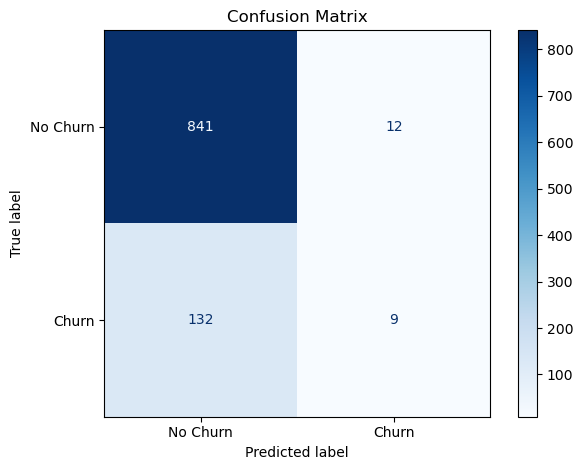

In [31]:
# Predict and evaluate
y_pred = log_model.predict(X_test)
print("📊 Classification Report:\n")
print(classification_report(y_test, y_pred, target_names=["No Churn", "Churn"]))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No Churn", "Churn"])
disp.plot(cmap='Blues')
plt.title("Confusion Matrix")
plt.tight_layout()
plt.show()

In [32]:

# Create pipeline: StandardScaler + KNN
knn_model = KNeighborsClassifier(n_neighbors=5) 

# Train the model
knn_model.fit(X_train, y_train)



KNeighborsClassifier()

📊 KNN Classification Report:

              precision    recall  f1-score   support

    No Churn       0.90      0.98      0.93       853
       Churn       0.69      0.32      0.44       141

    accuracy                           0.88       994
   macro avg       0.79      0.65      0.69       994
weighted avg       0.87      0.88      0.86       994



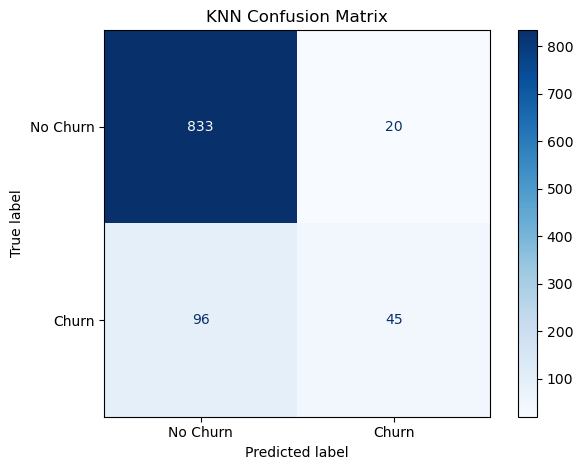

In [33]:
# Predict and evaluate
y_pred_knn = knn_model.predict(X_test)

print("📊 KNN Classification Report:\n")
print(classification_report(y_test, y_pred_knn, target_names=["No Churn", "Churn"]))

# Confusion Matrix for KNN
cm_knn = confusion_matrix(y_test, y_pred_knn)
disp_knn = ConfusionMatrixDisplay(confusion_matrix=cm_knn, display_labels=["No Churn", "Churn"])
disp_knn.plot(cmap='Blues')
plt.title("KNN Confusion Matrix")
plt.tight_layout()
plt.show()


In [34]:
X = df.loc[:,['account.length', 'voice.plan', 'voice.messages', 'intl.plan',
       'intl.mins', 'intl.calls', 'intl.charge', 'day.mins', 'day.calls',
       'day.charge', 'eve.mins', 'eve.calls', 'eve.charge', 'night.mins',
       'night.calls', 'night.charge', 'customer.calls',
       'total_minutes', 'total_calls', 'state_encoded', 'area_code_encoded']]
y = df['churn']

In [35]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [36]:

# Train the decision tree (no need for scaling)
# Control depth and splits
dt_model = DecisionTreeClassifier(max_depth=8, min_samples_split=20, random_state=42)

dt_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_dt = dt_model.predict(X_test)



📊 Decision Tree Classification Report:

              precision    recall  f1-score   support

    No Churn       0.96      0.99      0.98       853
       Churn       0.90      0.78      0.84       141

    accuracy                           0.96       994
   macro avg       0.93      0.88      0.91       994
weighted avg       0.96      0.96      0.96       994



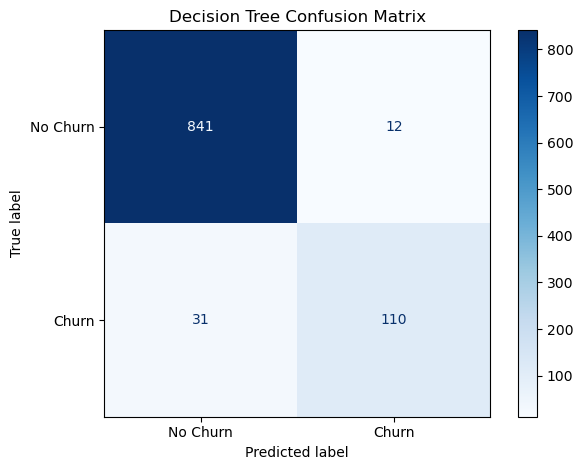

In [37]:
print("📊 Decision Tree Classification Report:\n")
print(classification_report(y_test, y_pred_dt, target_names=["No Churn", "Churn"]))

# Confusion Matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)
disp_dt = ConfusionMatrixDisplay(confusion_matrix=cm_dt, display_labels=["No Churn", "Churn"])
disp_dt.plot(cmap='Blues')
plt.title("Decision Tree Confusion Matrix")
plt.tight_layout()
plt.show()


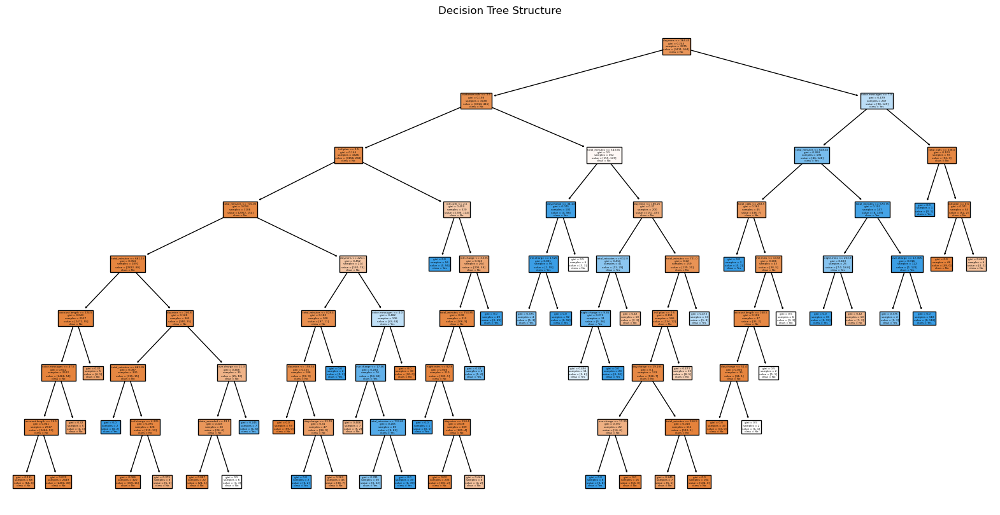

In [38]:

plt.figure(figsize=(20, 10))
plot_tree(dt_model, feature_names=X.columns, class_names=["No", "Yes"], filled=True)
plt.title("Decision Tree Structure")
plt.show()


In [39]:

# Initialize and train the model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_rf = rf_model.predict(X_test)


📊 Random Forest Classification Report:

              precision    recall  f1-score   support

    No Churn       0.97      0.99      0.98       853
       Churn       0.95      0.79      0.86       141

    accuracy                           0.96       994
   macro avg       0.96      0.89      0.92       994
weighted avg       0.96      0.96      0.96       994



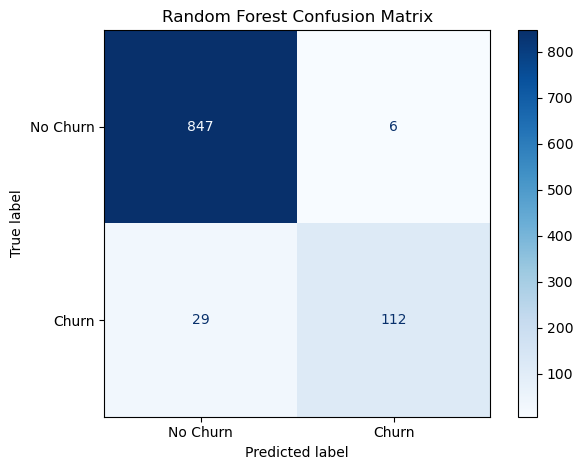

In [40]:

print("📊 Random Forest Classification Report:\n")
print(classification_report(y_test, y_pred_rf, target_names=["No Churn", "Churn"]))

# Confusion Matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)
disp_rf = ConfusionMatrixDisplay(confusion_matrix=cm_rf, display_labels=["No Churn", "Churn"])
disp_rf.plot(cmap='Blues')
plt.title("Random Forest Confusion Matrix")
plt.tight_layout()
plt.show()


C:\Users\lbt99\AppData\Local\Temp\ipykernel_9672\993852668.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[indices][:10], y=X.columns[indices][:10], palette='viridis')


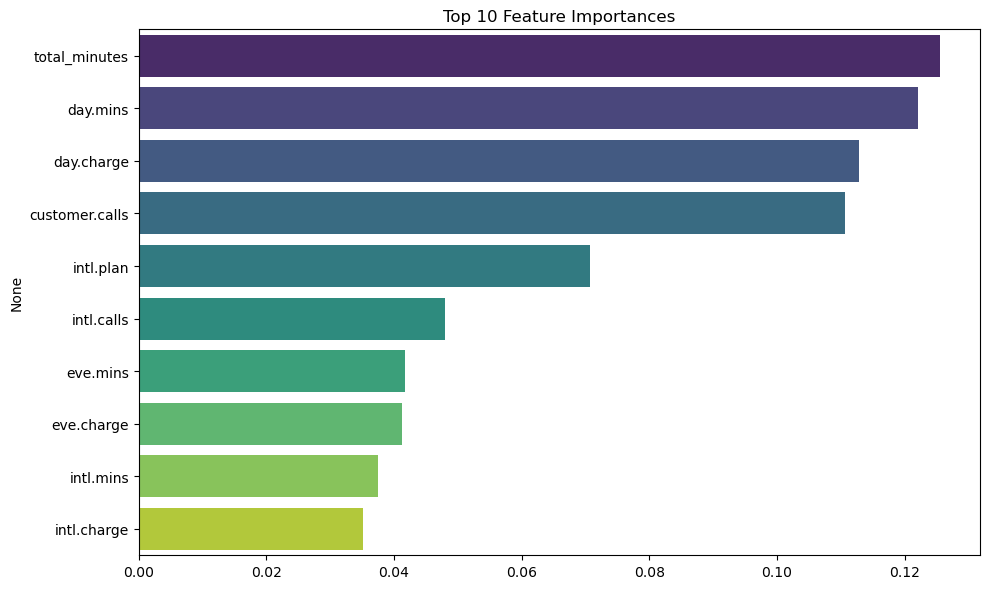

In [41]:

# Plot feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
plt.title("Top 10 Feature Importances")
sns.barplot(x=importances[indices][:10], y=X.columns[indices][:10], palette='viridis')
plt.tight_layout()
plt.show()


C:\Users\lbt99\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [00:35:03] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


📊 XGBoost Classification Report:

              precision    recall  f1-score   support

    No Churn       0.97      0.99      0.98       853
       Churn       0.94      0.79      0.86       141

    accuracy                           0.96       994
   macro avg       0.95      0.89      0.92       994
weighted avg       0.96      0.96      0.96       994



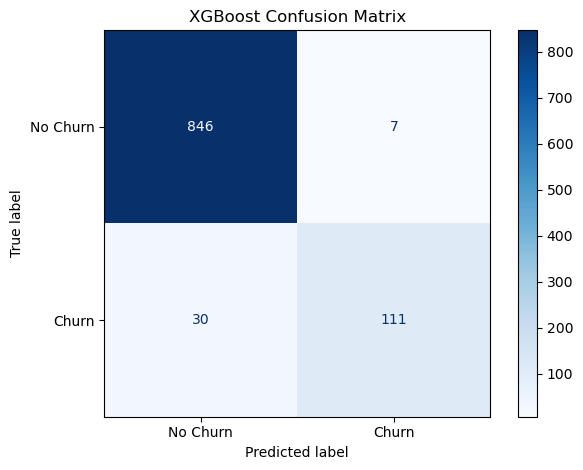

In [42]:

# Initialize XGBoost model
xgb_model = XGBClassifier(
    use_label_encoder=False,
    eval_metric='logloss',
    random_state=42
)

# Train the model
xgb_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_xgb = xgb_model.predict(X_test)

print("📊 XGBoost Classification Report:\n")
print(classification_report(y_test, y_pred_xgb, target_names=["No Churn", "Churn"]))

# Confusion Matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
disp_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb, display_labels=["No Churn", "Churn"])
disp_xgb.plot(cmap='Blues')
plt.title("XGBoost Confusion Matrix")
plt.tight_layout()
plt.show()


<Figure size 1000x600 with 0 Axes>

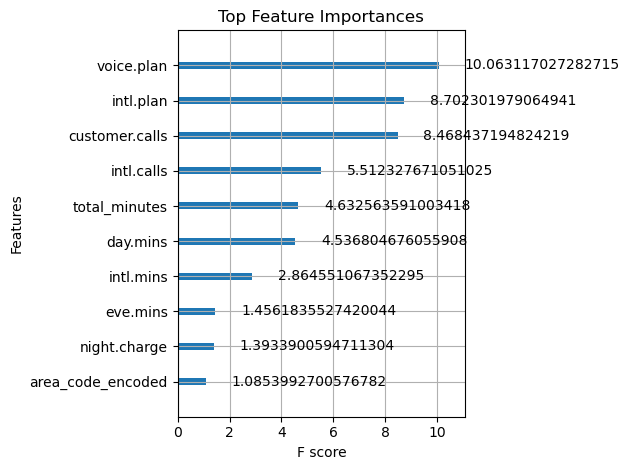

In [43]:

plt.figure(figsize=(10, 6))
plot_importance(xgb_model, max_num_features=10, importance_type='gain', title='Top Feature Importances')
plt.tight_layout()
plt.show()


[LightGBM] [Info] Number of positive: 564, number of negative: 3411
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2914
[LightGBM] [Info] Number of data points in the train set: 3975, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.141887 -> initscore=-1.799707
[LightGBM] [Info] Start training from score -1.799707
📊 LightGBM Classification Report:

              precision    recall  f1-score   support

    No Churn       0.98      0.99      0.98       853
       Churn       0.91      0.86      0.88       141

    accuracy                           0.97       994
   macro avg       0.94      0.92      0.93       994
weighted avg       0.97      0.97      0.97       994



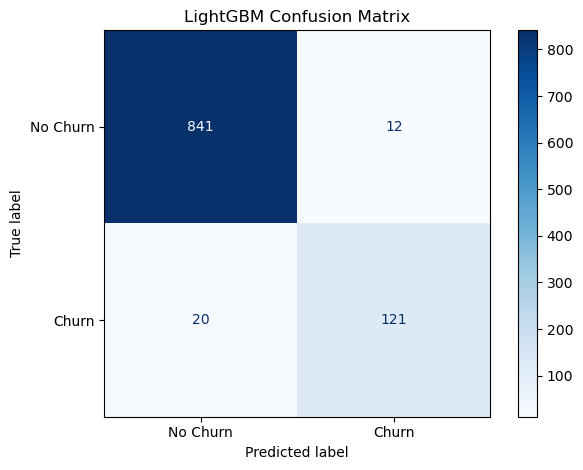

In [44]:

# Initialize the model
lgbm_model = LGBMClassifier(
    random_state=42,
    is_unbalance=True  # Helps with class imbalance
)

# Train the model
lgbm_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_lgbm = lgbm_model.predict(X_test)

print("📊 LightGBM Classification Report:\n")
print(classification_report(y_test, y_pred_lgbm, target_names=["No Churn", "Churn"]))

# Confusion Matrix
cm_lgbm = confusion_matrix(y_test, y_pred_lgbm)
disp_lgbm = ConfusionMatrixDisplay(confusion_matrix=cm_lgbm, display_labels=["No Churn", "Churn"])
disp_lgbm.plot(cmap='Blues')
plt.title("LightGBM Confusion Matrix")
plt.tight_layout()
plt.show()


C:\Users\lbt99\AppData\Local\Temp\ipykernel_9672\3815104352.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=importances[indices][:10], y=X.columns[indices][:10], palette="crest")


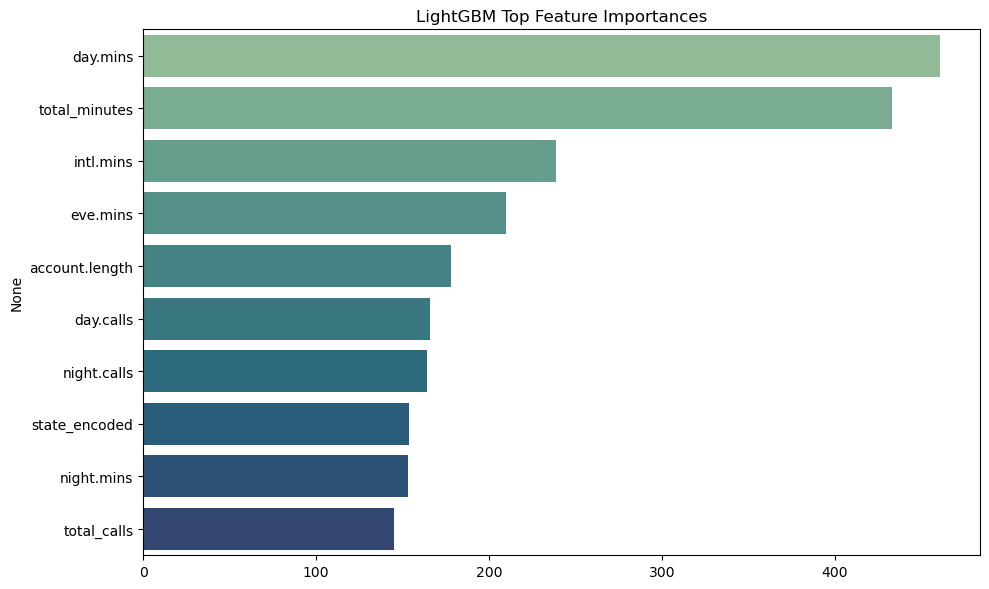

In [45]:

# Plot top 10 important features
importances = lgbm_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances[indices][:10], y=X.columns[indices][:10], palette="crest")
plt.title("LightGBM Top Feature Importances")
plt.tight_layout()
plt.show()


In [46]:

# Redo predictions with proper variable names
y_pred_logreg = log_model.predict(X_test)
y_pred_knn = knn_model.predict(X_test)
y_pred_dt = dt_model.predict(X_test)
y_pred_rf = rf_model.predict(X_test)
y_pred_xgb = xgb_model.predict(X_test)
y_pred_lgbm = lgbm_model.predict(X_test)


# Create a function to evaluate models
def get_metrics(model_name, y_true, y_pred):
    return {
        "Model": model_name,
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred),
        "Recall": recall_score(y_true, y_pred),
        "F1 Score": f1_score(y_true, y_pred)
    }

# Collect all predictions and evaluate
results = []
results.append(get_metrics("Logistic Regression", y_test, y_pred_logreg))
results.append(get_metrics("KNN", y_test, y_pred_knn))
results.append(get_metrics("Decision Tree", y_test, y_pred_dt))
results.append(get_metrics("Random Forest", y_test, y_pred_rf))
results.append(get_metrics("XGBoost", y_test, y_pred_xgb))
results.append(get_metrics("LightGBM", y_test, y_pred_lgbm))

# Display as DataFrame
results_df = pd.DataFrame(results)
results_df.set_index("Model", inplace=True)
results_df = results_df.sort_values(by="F1 Score", ascending=False)

print("\n📊 Model Performance Comparison:\n")
display(results_df)



📊 Model Performance Comparison:



,Accuracy,Precision,Recall,F1 Score
Model,,,,
LightGBM,0.967807,0.909774,0.858156,0.883212
Random Forest,0.964789,0.949153,0.794326,0.864865
XGBoost,0.962777,0.940678,0.787234,0.857143
Decision Tree,0.956740,0.901639,0.780142,0.836502
KNN,0.883300,0.692308,0.319149,0.436893
Logistic Regression,0.855131,0.428571,0.063830,0.111111


In [47]:
import joblib

# Save model and encoders
joblib.dump(lgbm_model, "lgbm_churn_model.pkl")
joblib.dump(le_state, "le_state.pkl")
joblib.dump(le_area, "le_area.pkl")


['le_area.pkl']